# Value / Momentum / Volume Strategy

## Original Script by Nick McCullum, Enhanced & Automated by Xavier E. Diaz

#### McCullum's Video Reference: https://www.youtube.com/watch?v=xfzGZB4HhEE&t=2s
#### McCullum's Github: https://github.com/nickmccullum/algorithmic-trading-python

In [1]:
import numpy as np #The Numpy numerical computing library
import pandas as pd #The Pandas data science library
import requests #The requests library for HTTP requests in Python
import xlsxwriter #The XlsxWriter libarary for 
import math #The Python math module
from scipy import stats #The SciPy stats module
import matplotlib.pyplot as plt
from array import array
import shlex

# Inputs

In [2]:
# Stock Ticker Universe
url = r'C:\Users\Lariel\Downloads\sp_500_stocks.csv'

In [3]:
def portfolio_input():
    global portfolio_size
    portfolio_size = input("Enter the value of your portfolio:")

    try:
        val = float(portfolio_size)
    except ValueError:
        print("That's not a number! \n Try again:")
        portfolio_size = input("Enter the value of your portfolio:")
        
portfolio_input()

Enter the value of your portfolio:10000


In [4]:
ValuePercentile = int(input("Value Bottom Percentile: "))

Value Bottom Percentile: 20


In [5]:
MomentumPercentile = int(input("Momentum Top Percentile: "))

Momentum Top Percentile: 20


In [6]:
VolumePercentile = int(input("Volume Top Percentile: "))

Volume Top Percentile: 20


In [7]:
while True:
    a = input("Do you want to include all MarketCaps. Enter yes/no to continue")
    if a=="yes":
        MarketSize = ['Large', 'Mid', 'Small']
        break
    elif a=="no":
        MarketSize = input("Enter Quote-Delimeted MarketCap Sizes: ")
        import shlex
        MarketSize = shlex.split(MarketSize)
        break
    else:
        print("Enter either yes/no")

Do you want to include all MarketCaps. Enter yes/no to continueyes


In [8]:
MarketSize

['Large', 'Mid', 'Small']

In [9]:
while True:
    a = input("Do you want to include all industries. Enter yes/no to continue")
    if a=="yes":
        IndustryName = ['Manufacturing',
       'Transportation, Communications, Electric, Gas, And Sanitary Services',
       'Retail Trade', 'Services', 'Wholesale Trade',
       'Finance, Insurance, And Real Estate', 'Not Found', 'Mining',
       'Public Administration', 'Agriculture, Forestry, And Fishing',
       'Construction']
        break
    elif a=="no":
        IndustryName = input("Enter Quote-Delimeted Industry Names: ")
        import shlex
        IndustryName = shlex.split(IndustryName)
        break
    else:
        print("Enter either yes/no")

Do you want to include all industries. Enter yes/no to continueyes


In [10]:
IndustryName

['Manufacturing',
 'Transportation, Communications, Electric, Gas, And Sanitary Services',
 'Retail Trade',
 'Services',
 'Wholesale Trade',
 'Finance, Insurance, And Real Estate',
 'Not Found',
 'Mining',
 'Public Administration',
 'Agriculture, Forestry, And Fishing',
 'Construction']

### Ticker Load & API Token Activation

In [11]:
stocks = pd.read_csv(url)
IEX_CLOUD_API_TOKEN = 'Tpk_059b97af715d417d9f49f50b51b1c448'

# Function sourced from 
# https://stackoverflow.com/questions/312443/how-do-you-split-a-list-into-evenly-sized-chunks
def chunks(lst, n):
    """Yield successive n-sized chunks from lst."""
    for i in range(0, len(lst), n):
        yield lst[i:i + n]   
# 5 lists of 100        
symbol_groups = list(chunks(stocks['Ticker'], 100))
symbol_strings = []
for i in range(0, len(symbol_groups)):
    symbol_strings.append(','.join(symbol_groups[i]))
#     print(symbol_strings[i])

# Quantitative Value Strategy

### Column Reference & DataFrame Creation

#### Original Variables

rv_columns = [
    'Ticker',
    'Price',
    'Number of Shares to Buy', 
    'Price-to-Earnings Ratio',
    'PE Percentile',
    'Price-to-Book Ratio',
    'PB Percentile',
    'Price-to-Sales Ratio',
    'PS Percentile',
    'EV/EBITDA',
    'EV/EBITDA Percentile',
    'EV/GP',
    'EV/GP Percentile',
    'RV Score'
]

In [12]:
#Saca columnas que quieres utilizar

rv_columns = [
    'Ticker',
    'Name',
    'Price',
    'MarketCap',
    'SIC',
    'Number of Shares to Buy', 
    'Price-to-Earnings Ratio',
    'PE Percentile',
    'Price-to-Book Ratio',
    'PB Percentile',
    'Price-to-Sales Ratio',
    'PS Percentile',
    'EV/EBITDA',
    'EV/EBITDA Percentile',
    'EV/GP',
    'EV/GP Percentile',
    'PegRatio',
    'PegRatio Percentile',
    'EV/Revenue',
    'EV/Revenue Percentile',
    'RV Score'
]

# Crea DatFrame con columnas 

rv_dataframe = pd.DataFrame(columns = rv_columns)

# Crea funcion para extraer datos y referenciarlos a las columnas indicadas
symbol_string = [] # Todos los tickers originales, puedes cambiarlo escribiendo los tickers deseados aqui 

for symbol_string in symbol_strings:
    batch_api_call_url = f'https://sandbox.iexapis.com/stable/stock/market/batch?symbols={symbol_string}&types=quote,company,stats,advanced-stats&token={IEX_CLOUD_API_TOKEN}'
    data = requests.get(batch_api_call_url).json()
    for symbol in symbol_string.split(','):
        enterprise_value = data[symbol]['advanced-stats']['enterpriseValue']
        ebitda = data[symbol]['advanced-stats']['EBITDA']
        gross_profit = data[symbol]['advanced-stats']['grossProfit']
        
        try:
            ev_to_ebitda = enterprise_value/ebitda
        except TypeError:
            ev_to_ebitda = np.NaN
        
        try:
            ev_to_gross_profit = enterprise_value/gross_profit
        except TypeError:
            ev_to_gross_profit = np.NaN
            
        rv_dataframe = rv_dataframe.append(
            pd.Series([
                symbol,
                data[symbol]['stats']['companyName'],
                data[symbol]['quote']['latestPrice'],
                data[symbol]['stats']['marketcap'],
                data[symbol]['company']['primarySicCode'],
                'N/A',
                data[symbol]['quote']['peRatio'],
                'N/A',
                data[symbol]['advanced-stats']['priceToBook'],
                'N/A',
                data[symbol]['advanced-stats']['priceToSales'],
                'N/A',
                ev_to_ebitda,
                'N/A',
                ev_to_gross_profit,
                'N/A',
                data[symbol]['advanced-stats']['pegRatio'],
                'N/A',
                data[symbol]['advanced-stats']['enterpriseValueToRevenue'],
                'N/A',
                'N/A'
        ],
        index = rv_columns),
            ignore_index = True
        )
        

# Columns with missing values
rv_dataframe[rv_dataframe.isnull().any(axis=1)]

# replace missing values with mean 
for column in ['Price-to-Earnings Ratio', 'Price-to-Book Ratio','Price-to-Sales Ratio',  'EV/EBITDA','PegRatio','EV/Revenue']:
    rv_dataframe[column].fillna(rv_dataframe[column].mean(), inplace = True)
    
rv_dataframe

,Ticker,Name,Price,MarketCap,SIC,Number of Shares to Buy,Price-to-Earnings Ratio,PE Percentile,Price-to-Book Ratio,PB Percentile,...,PS Percentile,EV/EBITDA,EV/EBITDA Percentile,EV/GP,EV/GP Percentile,PegRatio,PegRatio Percentile,EV/Revenue,EV/Revenue Percentile,RV Score
0,A,Agilent Technologies Inc.,163.05,48031925465,3934,N/A,50.71,N/A,9.83,N/A,...,N/A,31.718435,N/A,15.231147,N/A,1.078572,N/A,8.21,N/A,N/A
1,AAL,American Airlines Group Inc,19.85,12977781885,4588,N/A,-2.01,N/A,-1.69,N/A,...,N/A,-4.618706,N/A,1.912716,N/A,0.101065,N/A,1.87,N/A,N/A
2,AAP,Advance Auto Parts Inc,243.39,15108337550,5735,N/A,26.08,N/A,4.58,N/A,...,N/A,12.916452,N/A,3.136054,N/A,0.548671,N/A,1.42,N/A,N/A
3,AAPL,Apple Inc,151.49,2564899952807,3749,N/A,30.15,N/A,39.77,N/A,...,N/A,23.489919,N/A,18.096052,N/A,0.528316,N/A,7.44,N/A,N/A
4,ABBV,Abbvie Inc,110.27,199127447436,2924,N/A,29.53,N/A,15.52,N/A,...,N/A,10.915470,N/A,7.491890,N/A,-1.657462,N/A,5.08,N/A,N/A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
500,YUM,Yum Brands Inc.,131.35,39280008429,6025,N/A,29.90,N/A,-4.98,N/A,...,N/A,21.841120,N/A,9.925648,N/A,0.961455,N/A,7.87,N/A,N/A
501,ZBH,Zimmer Biomet Holdings Inc,151.15,32530307904,3879,N/A,35.13,N/A,2.60,N/A,...,N/A,21.030255,N/A,6.995038,N/A,0.014696,N/A,5.10,N/A,N/A
502,ZBRA,Zebra Technologies Corp.,533.14,28709453859,3626,N/A,38.60,N/A,11.52,N/A,...,N/A,29.338789,N/A,12.241277,N/A,0.694300,N/A,5.82,N/A,N/A
503,ZION,Zions Bancorporation N.A,68.10,10852225947,6041,N/A,6.59,N/A,1.42,N/A,...,N/A,5.218757,N/A,2.894568,N/A,0.021728,N/A,3.10,N/A,N/A


### Add Industry & Size Variables

In [13]:
conditions = [
    (rv_dataframe['SIC'] < 1000),
    (rv_dataframe['SIC'] > 999) & (rv_dataframe['SIC'] < 1500),
    (rv_dataframe['SIC'] > 1499) & (rv_dataframe['SIC'] < 1800),
    (rv_dataframe['SIC'] > 1999) & (rv_dataframe['SIC'] < 4000),
    (rv_dataframe['SIC'] > 3999) & (rv_dataframe['SIC'] < 5000),
    (rv_dataframe['SIC'] > 4999) & (rv_dataframe['SIC'] < 5200),
    (rv_dataframe['SIC'] > 5199) & (rv_dataframe['SIC'] < 6000),
    (rv_dataframe['SIC'] > 5999) & (rv_dataframe['SIC'] < 6800),
    (rv_dataframe['SIC'] > 6999) & (rv_dataframe['SIC'] < 9000),
    (rv_dataframe['SIC'] > 8900)]
choices = ['Agriculture, Forestry, And Fishing', 'Mining', 'Construction','Manufacturing','Transportation, Communications, Electric, Gas, And Sanitary Services','Wholesale Trade','Retail Trade','Finance, Insurance, And Real Estate','Services', 'Public Administration']
rv_dataframe['Industry'] = np.select(conditions, choices, default='Not Found')

conditions = [
    (rv_dataframe['MarketCap'] < 2000000000),
    (rv_dataframe['MarketCap'] > 2000000000) & (rv_dataframe['MarketCap'] < 10000000000),
    (rv_dataframe['MarketCap'] > 10000000000)]
choices = ['Small', 'Mid', 'Large']
rv_dataframe['Size'] = np.select(conditions, choices, default='Not Found')

pd.set_option("display.max_rows", None, "display.max_columns", None)
rv_dataframe

,Ticker,Name,Price,MarketCap,SIC,Number of Shares to Buy,Price-to-Earnings Ratio,PE Percentile,Price-to-Book Ratio,PB Percentile,Price-to-Sales Ratio,PS Percentile,EV/EBITDA,EV/EBITDA Percentile,EV/GP,EV/GP Percentile,PegRatio,PegRatio Percentile,EV/Revenue,EV/Revenue Percentile,RV Score,Industry,Size
0,A,Agilent Technologies Inc.,163.050,48031925465,3934,N/A,50.710000,N/A,9.830000,N/A,8.040000,N/A,31.718435,N/A,15.231147,N/A,1.078572,N/A,8.210000,N/A,N/A,Manufacturing,Large
1,AAL,American Airlines Group Inc,19.850,12977781885,4588,N/A,-2.010000,N/A,-1.690000,N/A,0.708500,N/A,-4.618706,N/A,1.912716,N/A,0.101065,N/A,1.870000,N/A,N/A,"Transportation, Communications, Electric, Gas,...",Large
2,AAP,Advance Auto Parts Inc,243.390,15108337550,5735,N/A,26.080000,N/A,4.580000,N/A,1.350000,N/A,12.916452,N/A,3.136054,N/A,0.548671,N/A,1.420000,N/A,N/A,Retail Trade,Large
3,AAPL,Apple Inc,151.490,2564899952807,3749,N/A,30.150000,N/A,39.770000,N/A,7.420000,N/A,23.489919,N/A,18.096052,N/A,0.528316,N/A,7.440000,N/A,N/A,Manufacturing,Large
4,ABBV,Abbvie Inc,110.270,199127447436,2924,N/A,29.530000,N/A,15.520000,N/A,3.710000,N/A,10.915470,N/A,7.491890,N/A,-1.657462,N/A,5.080000,N/A,N/A,Manufacturing,Large
5,ABC,Amerisource Bergen Corp.,126.070,25944393602,5262,N/A,-6.830000,N/A,698.720000,N/A,0.128500,N/A,9.797985,N/A,4.883735,N/A,0.020241,N/A,0.150000,N/A,N/A,Retail Trade,Large
6,ABMD,Abiomed Inc.,365.600,16347522546,3875,N/A,105.300000,N/A,12.260000,N/A,17.080000,N/A,53.535838,N/A,19.312432,N/A,-41.069061,N/A,16.450000,N/A,N/A,Manufacturing,Large
7,ABT,Abbott Laboratories,129.670,222771533934,2975,N/A,35.900000,N/A,6.730000,N/A,5.640000,N/A,25.123319,N/A,10.307670,N/A,0.350041,N/A,5.790000,N/A,N/A,Manufacturing,Large
8,ACN,Accenture plc,365.060,229978335380,7417,N/A,40.620000,N/A,11.860000,N/A,4.730000,N/A,22.917241,N/A,13.472505,N/A,2.432040,N/A,4.510000,N/A,N/A,Services,Large
9,ADBE,Adobe Inc,668.100,317271960381,7645,N/A,54.800000,N/A,21.800000,N/A,20.560000,N/A,51.479399,N/A,22.174727,N/A,0.989597,N/A,20.300000,N/A,N/A,Services,Large


### Industry Filter

In [14]:
rv_dataframe = rv_dataframe[rv_dataframe['Industry'].isin(IndustryName)]
rv_dataframe

,Ticker,Name,Price,MarketCap,SIC,Number of Shares to Buy,Price-to-Earnings Ratio,PE Percentile,Price-to-Book Ratio,PB Percentile,Price-to-Sales Ratio,PS Percentile,EV/EBITDA,EV/EBITDA Percentile,EV/GP,EV/GP Percentile,PegRatio,PegRatio Percentile,EV/Revenue,EV/Revenue Percentile,RV Score,Industry,Size
0,A,Agilent Technologies Inc.,163.050,48031925465,3934,N/A,50.710000,N/A,9.830000,N/A,8.040000,N/A,31.718435,N/A,15.231147,N/A,1.078572,N/A,8.210000,N/A,N/A,Manufacturing,Large
1,AAL,American Airlines Group Inc,19.850,12977781885,4588,N/A,-2.010000,N/A,-1.690000,N/A,0.708500,N/A,-4.618706,N/A,1.912716,N/A,0.101065,N/A,1.870000,N/A,N/A,"Transportation, Communications, Electric, Gas,...",Large
2,AAP,Advance Auto Parts Inc,243.390,15108337550,5735,N/A,26.080000,N/A,4.580000,N/A,1.350000,N/A,12.916452,N/A,3.136054,N/A,0.548671,N/A,1.420000,N/A,N/A,Retail Trade,Large
3,AAPL,Apple Inc,151.490,2564899952807,3749,N/A,30.150000,N/A,39.770000,N/A,7.420000,N/A,23.489919,N/A,18.096052,N/A,0.528316,N/A,7.440000,N/A,N/A,Manufacturing,Large
4,ABBV,Abbvie Inc,110.270,199127447436,2924,N/A,29.530000,N/A,15.520000,N/A,3.710000,N/A,10.915470,N/A,7.491890,N/A,-1.657462,N/A,5.080000,N/A,N/A,Manufacturing,Large
5,ABC,Amerisource Bergen Corp.,126.070,25944393602,5262,N/A,-6.830000,N/A,698.720000,N/A,0.128500,N/A,9.797985,N/A,4.883735,N/A,0.020241,N/A,0.150000,N/A,N/A,Retail Trade,Large
6,ABMD,Abiomed Inc.,365.600,16347522546,3875,N/A,105.300000,N/A,12.260000,N/A,17.080000,N/A,53.535838,N/A,19.312432,N/A,-41.069061,N/A,16.450000,N/A,N/A,Manufacturing,Large
7,ABT,Abbott Laboratories,129.670,222771533934,2975,N/A,35.900000,N/A,6.730000,N/A,5.640000,N/A,25.123319,N/A,10.307670,N/A,0.350041,N/A,5.790000,N/A,N/A,Manufacturing,Large
8,ACN,Accenture plc,365.060,229978335380,7417,N/A,40.620000,N/A,11.860000,N/A,4.730000,N/A,22.917241,N/A,13.472505,N/A,2.432040,N/A,4.510000,N/A,N/A,Services,Large
9,ADBE,Adobe Inc,668.100,317271960381,7645,N/A,54.800000,N/A,21.800000,N/A,20.560000,N/A,51.479399,N/A,22.174727,N/A,0.989597,N/A,20.300000,N/A,N/A,Services,Large


### MarketCap Filter

In [15]:
rv_dataframe = rv_dataframe[rv_dataframe['Size'].isin(MarketSize)]
rv_dataframe = rv_dataframe.reset_index(drop=True)
rv_dataframe

,Ticker,Name,Price,MarketCap,SIC,Number of Shares to Buy,Price-to-Earnings Ratio,PE Percentile,Price-to-Book Ratio,PB Percentile,Price-to-Sales Ratio,PS Percentile,EV/EBITDA,EV/EBITDA Percentile,EV/GP,EV/GP Percentile,PegRatio,PegRatio Percentile,EV/Revenue,EV/Revenue Percentile,RV Score,Industry,Size
0,A,Agilent Technologies Inc.,163.050,48031925465,3934,N/A,50.710000,N/A,9.830000,N/A,8.040000,N/A,31.718435,N/A,15.231147,N/A,1.078572,N/A,8.210000,N/A,N/A,Manufacturing,Large
1,AAL,American Airlines Group Inc,19.850,12977781885,4588,N/A,-2.010000,N/A,-1.690000,N/A,0.708500,N/A,-4.618706,N/A,1.912716,N/A,0.101065,N/A,1.870000,N/A,N/A,"Transportation, Communications, Electric, Gas,...",Large
2,AAP,Advance Auto Parts Inc,243.390,15108337550,5735,N/A,26.080000,N/A,4.580000,N/A,1.350000,N/A,12.916452,N/A,3.136054,N/A,0.548671,N/A,1.420000,N/A,N/A,Retail Trade,Large
3,AAPL,Apple Inc,151.490,2564899952807,3749,N/A,30.150000,N/A,39.770000,N/A,7.420000,N/A,23.489919,N/A,18.096052,N/A,0.528316,N/A,7.440000,N/A,N/A,Manufacturing,Large
4,ABBV,Abbvie Inc,110.270,199127447436,2924,N/A,29.530000,N/A,15.520000,N/A,3.710000,N/A,10.915470,N/A,7.491890,N/A,-1.657462,N/A,5.080000,N/A,N/A,Manufacturing,Large
5,ABC,Amerisource Bergen Corp.,126.070,25944393602,5262,N/A,-6.830000,N/A,698.720000,N/A,0.128500,N/A,9.797985,N/A,4.883735,N/A,0.020241,N/A,0.150000,N/A,N/A,Retail Trade,Large
6,ABMD,Abiomed Inc.,365.600,16347522546,3875,N/A,105.300000,N/A,12.260000,N/A,17.080000,N/A,53.535838,N/A,19.312432,N/A,-41.069061,N/A,16.450000,N/A,N/A,Manufacturing,Large
7,ABT,Abbott Laboratories,129.670,222771533934,2975,N/A,35.900000,N/A,6.730000,N/A,5.640000,N/A,25.123319,N/A,10.307670,N/A,0.350041,N/A,5.790000,N/A,N/A,Manufacturing,Large
8,ACN,Accenture plc,365.060,229978335380,7417,N/A,40.620000,N/A,11.860000,N/A,4.730000,N/A,22.917241,N/A,13.472505,N/A,2.432040,N/A,4.510000,N/A,N/A,Services,Large
9,ADBE,Adobe Inc,668.100,317271960381,7645,N/A,54.800000,N/A,21.800000,N/A,20.560000,N/A,51.479399,N/A,22.174727,N/A,0.989597,N/A,20.300000,N/A,N/A,Services,Large


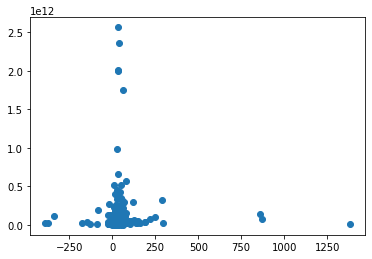

In [16]:
import matplotlib.pyplot as plt
import math
import numpy as np

plt.scatter(rv_dataframe['Price-to-Earnings Ratio'], rv_dataframe.MarketCap)
plt.show()

### Create percentile Variables 

In [17]:
# Percentilas de ratios financieros # 'P/E/Rev. Growth':'P/E/Rev. Growth Percentile',

# Crear diccionario para nuevas columnas de percentilas con las columnas de referencia 
metrics = {
            'Price-to-Earnings Ratio': 'PE Percentile',
            'Price-to-Book Ratio':'PB Percentile',
            'Price-to-Sales Ratio': 'PS Percentile',
            'EV/EBITDA':'EV/EBITDA Percentile',
            'EV/GP':'EV/GP Percentile',
            'PegRatio':'PegRatio Percentile',
            'EV/Revenue':'EV/Revenue Percentile'
}

# Funcion para crear df con columnas de referencias 

for row in rv_dataframe.index:
    for metric in metrics.keys():
        rv_dataframe.loc[row, metrics[metric]] = stats.percentileofscore(rv_dataframe[metric], rv_dataframe.loc[row, metric])/100

# Print each percentile score to make sure it was calculated properly
for metric in metrics.values():
    print(rv_dataframe[metric])

#Print the entire DataFrame    
rv_dataframe

0      0.829703
1      0.075248
2      0.493069
3      0.592079
4      0.574257
5      0.063366
6      0.962376
7      0.691089
8      0.754455
9      0.865347
10     0.734653
11     0.275248
12      0.69901
13     0.857426
14     0.458416
15     0.326733
16     0.011881
17     0.093069
18     0.207921
19     0.841584
20     0.437624
21     0.708911
22     0.621782
23     0.720792
24     0.918812
25     0.055446
26     0.146535
27     0.528713
28      0.89703
29     0.447525
30     0.420792
31     0.770297
32      0.69703
33          0.4
34     0.677228
35     0.875248
36      0.89505
37     0.789109
38     0.924752
39     0.489109
40     0.662376
41     0.475248
42     0.245545
43     0.647525
44     0.686139
45     0.823762
46     0.635644
47     0.318812
48     0.451485
49      0.60198
50     0.746535
51     0.481188
52     0.784158
53     0.394059
54     0.378218
55     0.051485
56     0.261386
57     0.712871
58      0.20198
59     0.748515
60     0.219802
61     0.782178
62     0

,Ticker,Name,Price,MarketCap,SIC,Number of Shares to Buy,Price-to-Earnings Ratio,PE Percentile,Price-to-Book Ratio,PB Percentile,Price-to-Sales Ratio,PS Percentile,EV/EBITDA,EV/EBITDA Percentile,EV/GP,EV/GP Percentile,PegRatio,PegRatio Percentile,EV/Revenue,EV/Revenue Percentile,RV Score,Industry,Size
0,A,Agilent Technologies Inc.,163.050,48031925465,3934,N/A,50.710000,0.829703,9.830000,0.79604,8.040000,0.817822,31.718435,0.875248,15.231147,0.807921,1.078572,0.80396,8.210000,0.80396,N/A,Manufacturing,Large
1,AAL,American Airlines Group Inc,19.850,12977781885,4588,N/A,-2.010000,0.075248,-1.690000,0.049505,0.708500,0.059406,-4.618706,0.025743,1.912716,0.079208,0.101065,0.435644,1.870000,0.212871,N/A,"Transportation, Communications, Electric, Gas,...",Large
2,AAP,Advance Auto Parts Inc,243.390,15108337550,5735,N/A,26.080000,0.493069,4.580000,0.553465,1.350000,0.169307,12.916452,0.378218,3.136054,0.150495,0.548671,0.671287,1.420000,0.144554,N/A,Retail Trade,Large
3,AAPL,Apple Inc,151.490,2564899952807,3749,N/A,30.150000,0.592079,39.770000,0.960396,7.420000,0.8,23.489919,0.736634,18.096052,0.857426,0.528316,0.667327,7.440000,0.744554,N/A,Manufacturing,Large
4,ABBV,Abbvie Inc,110.270,199127447436,2924,N/A,29.530000,0.574257,15.520000,0.891089,3.710000,0.518812,10.915470,0.283168,7.491890,0.479208,-1.657462,0.120792,5.080000,0.594059,N/A,Manufacturing,Large
5,ABC,Amerisource Bergen Corp.,126.070,25944393602,5262,N/A,-6.830000,0.063366,698.720000,1.0,0.128500,0.005941,9.797985,0.241584,4.883735,0.275248,0.020241,0.312871,0.150000,0.005941,N/A,Retail Trade,Large
6,ABMD,Abiomed Inc.,365.600,16347522546,3875,N/A,105.300000,0.962376,12.260000,0.839604,17.080000,0.950495,53.535838,0.952475,19.312432,0.875248,-41.069061,0.009901,16.450000,0.928713,N/A,Manufacturing,Large
7,ABT,Abbott Laboratories,129.670,222771533934,2975,N/A,35.900000,0.691089,6.730000,0.714851,5.640000,0.683168,25.123319,0.776238,10.307670,0.639604,0.350041,0.605941,5.790000,0.665347,N/A,Manufacturing,Large
8,ACN,Accenture plc,365.060,229978335380,7417,N/A,40.620000,0.754455,11.860000,0.833663,4.730000,0.620792,22.917241,0.726733,13.472505,0.766337,2.432040,0.90495,4.510000,0.525743,N/A,Services,Large
9,ADBE,Adobe Inc,668.100,317271960381,7645,N/A,54.800000,0.865347,21.800000,0.928713,20.560000,0.974257,51.479399,0.944554,22.174727,0.918812,0.989597,0.790099,20.300000,0.964356,N/A,Services,Large


## Calculating the RV Score

In [18]:
# Saca el promedio de las percentilas del activo i a traves de las columnas de referencia en "metrics"
from statistics import mean

for row in rv_dataframe.index:
    value_percentiles = []
    for metric in metrics.keys():
        value_percentiles.append(rv_dataframe.loc[row, metrics[metric]])
    rv_dataframe.loc[row, 'RV Score'] = mean(value_percentiles)
    
rv_dataframe

,Ticker,Name,Price,MarketCap,SIC,Number of Shares to Buy,Price-to-Earnings Ratio,PE Percentile,Price-to-Book Ratio,PB Percentile,Price-to-Sales Ratio,PS Percentile,EV/EBITDA,EV/EBITDA Percentile,EV/GP,EV/GP Percentile,PegRatio,PegRatio Percentile,EV/Revenue,EV/Revenue Percentile,RV Score,Industry,Size
0,A,Agilent Technologies Inc.,163.050,48031925465,3934,N/A,50.710000,0.829703,9.830000,0.79604,8.040000,0.817822,31.718435,0.875248,15.231147,0.807921,1.078572,0.80396,8.210000,0.80396,0.819236,Manufacturing,Large
1,AAL,American Airlines Group Inc,19.850,12977781885,4588,N/A,-2.010000,0.075248,-1.690000,0.049505,0.708500,0.059406,-4.618706,0.025743,1.912716,0.079208,0.101065,0.435644,1.870000,0.212871,0.133946,"Transportation, Communications, Electric, Gas,...",Large
2,AAP,Advance Auto Parts Inc,243.390,15108337550,5735,N/A,26.080000,0.493069,4.580000,0.553465,1.350000,0.169307,12.916452,0.378218,3.136054,0.150495,0.548671,0.671287,1.420000,0.144554,0.365771,Retail Trade,Large
3,AAPL,Apple Inc,151.490,2564899952807,3749,N/A,30.150000,0.592079,39.770000,0.960396,7.420000,0.8,23.489919,0.736634,18.096052,0.857426,0.528316,0.667327,7.440000,0.744554,0.765488,Manufacturing,Large
4,ABBV,Abbvie Inc,110.270,199127447436,2924,N/A,29.530000,0.574257,15.520000,0.891089,3.710000,0.518812,10.915470,0.283168,7.491890,0.479208,-1.657462,0.120792,5.080000,0.594059,0.494484,Manufacturing,Large
5,ABC,Amerisource Bergen Corp.,126.070,25944393602,5262,N/A,-6.830000,0.063366,698.720000,1.0,0.128500,0.005941,9.797985,0.241584,4.883735,0.275248,0.020241,0.312871,0.150000,0.005941,0.272136,Retail Trade,Large
6,ABMD,Abiomed Inc.,365.600,16347522546,3875,N/A,105.300000,0.962376,12.260000,0.839604,17.080000,0.950495,53.535838,0.952475,19.312432,0.875248,-41.069061,0.009901,16.450000,0.928713,0.788402,Manufacturing,Large
7,ABT,Abbott Laboratories,129.670,222771533934,2975,N/A,35.900000,0.691089,6.730000,0.714851,5.640000,0.683168,25.123319,0.776238,10.307670,0.639604,0.350041,0.605941,5.790000,0.665347,0.68232,Manufacturing,Large
8,ACN,Accenture plc,365.060,229978335380,7417,N/A,40.620000,0.754455,11.860000,0.833663,4.730000,0.620792,22.917241,0.726733,13.472505,0.766337,2.432040,0.90495,4.510000,0.525743,0.733239,Services,Large
9,ADBE,Adobe Inc,668.100,317271960381,7645,N/A,54.800000,0.865347,21.800000,0.928713,20.560000,0.974257,51.479399,0.944554,22.174727,0.918812,0.989597,0.790099,20.300000,0.964356,0.912306,Services,Large


## Selecting the x-Percentile Best Value Stocks

In [19]:
ValueData= pd.DataFrame(data=rv_dataframe)

In [20]:
# 50 cheapest stocks in our universe 
rv_dataframe.sort_values(by = 'RV Score', inplace = True) # Sort 
rv_dataframe = rv_dataframe[:round(len(rv_dataframe) * (ValuePercentile*.01))] # Return only top 50 stocks by above criteria
rv_dataframe.reset_index(inplace = True) # Reset Index 
rv_dataframe.drop('index', axis=1, inplace = True) # transform "index" column as index 

rv_dataframe

C:\Users\Lariel\anaconda3\envs\test\lib\site-packages\pandas\core\frame.py:4315: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,Ticker,Name,Price,MarketCap,SIC,Number of Shares to Buy,Price-to-Earnings Ratio,PE Percentile,Price-to-Book Ratio,PB Percentile,Price-to-Sales Ratio,PS Percentile,EV/EBITDA,EV/EBITDA Percentile,EV/GP,EV/GP Percentile,PegRatio,PegRatio Percentile,EV/Revenue,EV/Revenue Percentile,RV Score,Industry,Size
0,UNM,Unum Group,28.730,5922241630,6540,N/A,8.13,0.114851,0.5221,0.051485,0.4441,0.025743,3.602821,0.037624,0.431579,0.009901,-0.312767,0.253465,0.4429,0.013861,0.072419,"Finance, Insurance, And Real Estate",Mid
1,ALL,Allstate Corp (The),133.000,37489155090,6335,N/A,10.11,0.146535,1.4500,0.141584,0.7940,0.073267,2.459343,0.033663,0.767720,0.017822,-2.038743,0.110891,0.7960,0.057426,0.083027,"Finance, Insurance, And Real Estate",Large
2,PRU,Prudential Financial Inc.,118.040,44779201401,6456,N/A,6.39,0.087129,0.7119,0.059406,0.7065,0.057426,5.029272,0.047525,0.678951,0.013861,0.001434,0.279208,0.6849,0.047525,0.084583,"Finance, Insurance, And Real Estate",Large
3,KSS,Kohl`s Corp.,49.450,7347025535,5382,N/A,10.81,0.170297,1.3700,0.120792,0.4044,0.017822,4.188354,0.039604,1.152259,0.035644,0.012760,0.291089,0.4624,0.015842,0.098727,Retail Trade,Mid
4,MCK,Mckesson Corporation,212.730,32662331751,5307,N/A,-7.41,0.059406,-61.5200,0.013861,0.1320,0.007921,8.264273,0.188119,2.872116,0.126733,0.011567,0.289109,0.1553,0.007921,0.09901,Retail Trade,Large
5,GM,General Motors Company,58.680,85987574792,3716,N/A,6.87,0.091089,1.6600,0.188119,0.6158,0.051485,2.746816,0.035644,2.467291,0.114851,0.009025,0.285149,0.5287,0.027723,0.113437,Manufacturing,Large
6,MET,Metlife Inc,67.090,56395852535,6475,N/A,13.64,0.228713,0.8290,0.067327,0.8358,0.081188,6.407665,0.093069,0.824056,0.019802,-0.360125,0.247525,0.8551,0.065347,0.11471,"Finance, Insurance, And Real Estate",Large
7,LNC,Lincoln National Corp.,76.410,14394426881,6623,N/A,10.80,0.168317,0.6702,0.053465,0.7274,0.061386,8.163019,0.180198,0.696635,0.015842,0.019109,0.308911,0.7530,0.051485,0.119943,"Finance, Insurance, And Real Estate",Large
8,L,Loews Corp.,60.320,15078971016,6585,N/A,10.16,0.148515,0.8407,0.069307,1.0000,0.106931,5.559994,0.061386,0.975108,0.027723,0.039539,0.356436,1.0000,0.074257,0.120651,"Finance, Insurance, And Real Estate",Large
9,RE,Everest Re Group Ltd,286.500,11615764708,6343,N/A,8.66,0.124752,1.0900,0.078218,1.0172,0.110891,7.388981,0.128713,0.978375,0.029703,0.053568,0.376238,1.0069,0.081188,0.132815,"Finance, Insurance, And Real Estate",Large


# Quantitative Momentum Strategy

#### Original Variables


hqm_columns = [
                'Ticker', 
                'Price', 
                'Number of Shares to Buy', 
                'One-Year Price Return', 
                'One-Year Return Percentile',
                'Six-Month Price Return',
                'Six-Month Return Percentile',
                'Three-Month Price Return',
                'Three-Month Return Percentile',
                'One-Month Price Return',
                'One-Month Return Percentile',
                'HQM Score'
                ]

In [21]:
hqm_columns = [
                'Ticker', 
                'Name',
                'Price',
                'MarketCap',
                'SIC', 
                'Number of Shares to Buy', 
                'One-Year Price Return', 
                'One-Year Return Percentile',
                'Six-Month Price Return',
                'Six-Month Return Percentile',
                'Three-Month Price Return',
                'Three-Month Return Percentile',
                'One-Month Price Return',
                'One-Month Return Percentile',
                'Five-Day Price Return',
                'Five-Day Return Percentile',
                'HQM Score'
                ]

hqm_dataframe = pd.DataFrame(columns = hqm_columns)

for symbol_string in symbol_strings:
#     print(symbol_strings)
    batch_api_call_url = f'https://sandbox.iexapis.com/stable/stock/market/batch/?types=stats,advanced-stats,company,quote&symbols={symbol_string}&token={IEX_CLOUD_API_TOKEN}'
    data = requests.get(batch_api_call_url).json()
    for symbol in symbol_string.split(','):
        hqm_dataframe = hqm_dataframe.append(
                                        pd.Series([symbol, 
                                                   data[symbol]['stats']['companyName'],
                                                   data[symbol]['quote']['latestPrice'],
                                                   data[symbol]['stats']['marketcap'],
                                                   data[symbol]['company']['primarySicCode'],
                                                   'N/A',
                                                   data[symbol]['stats']['year1ChangePercent'],
                                                   'N/A',
                                                   data[symbol]['stats']['month6ChangePercent'],
                                                   'N/A',
                                                   data[symbol]['stats']['month3ChangePercent'],
                                                   'N/A',
                                                   data[symbol]['stats']['month1ChangePercent'],
                                                   'N/A',
                                                   data[symbol]['stats']['day5ChangePercent'],
                                                   'N/A',
                                                   'N/A'
                                                   ], 
                                                  index = hqm_columns), 
                                        ignore_index = True)
        
hqm_dataframe.columns

Index(['Ticker', 'Name', 'Price', 'MarketCap', 'SIC',
       'Number of Shares to Buy', 'One-Year Price Return',
       'One-Year Return Percentile', 'Six-Month Price Return',
       'Six-Month Return Percentile', 'Three-Month Price Return',
       'Three-Month Return Percentile', 'One-Month Price Return',
       'One-Month Return Percentile', 'Five-Day Price Return',
       'Five-Day Return Percentile', 'HQM Score'],
      dtype='object')

### Add Industry & Size Variables

In [22]:
conditions = [
    (hqm_dataframe['SIC'] < 1000),
    (hqm_dataframe['SIC'] > 999) & (hqm_dataframe['SIC'] < 1500),
    (hqm_dataframe['SIC'] > 1499) & (hqm_dataframe['SIC'] < 1800),
    (hqm_dataframe['SIC'] > 1999) & (hqm_dataframe['SIC'] < 4000),
    (hqm_dataframe['SIC'] > 3999) & (hqm_dataframe['SIC'] < 5000),
    (hqm_dataframe['SIC'] > 4999) & (hqm_dataframe['SIC'] < 5200),
    (hqm_dataframe['SIC'] > 5199) & (hqm_dataframe['SIC'] < 6000),
    (hqm_dataframe['SIC'] > 5999) & (hqm_dataframe['SIC'] < 6800),
    (hqm_dataframe['SIC'] > 6999) & (hqm_dataframe['SIC'] < 9000),
    (hqm_dataframe['SIC'] > 8900)]
choices = ['Agriculture, Forestry, And Fishing', 'Mining', 'Construction','Manufacturing','Transportation, Communications, Electric, Gas, And Sanitary Services','Wholesale Trade','Retail Trade','Finance, Insurance, And Real Estate','Services', 'Public Administration']
hqm_dataframe['Industry'] = np.select(conditions, choices, default='Not Found')

conditions = [
    (hqm_dataframe['MarketCap'] < 2000000000),
    (hqm_dataframe['MarketCap'] > 2000000000) & (hqm_dataframe['MarketCap'] < 10000000000),
    (hqm_dataframe['MarketCap'] > 10000000000)]
choices = ['Small', 'Mid', 'Large']
hqm_dataframe['Size'] = np.select(conditions, choices, default='Not Found')

pd.set_option("display.max_rows", None, "display.max_columns", None)
hqm_dataframe

,Ticker,Name,Price,MarketCap,SIC,Number of Shares to Buy,One-Year Price Return,One-Year Return Percentile,Six-Month Price Return,Six-Month Return Percentile,Three-Month Price Return,Three-Month Return Percentile,One-Month Price Return,One-Month Return Percentile,Five-Day Price Return,Five-Day Return Percentile,HQM Score,Industry,Size
0,A,Agilent Technologies Inc.,159.240,47558500031,3910,N/A,0.517075,N/A,0.179172,N/A,0.055085,N/A,-0.087179,N/A,0.029546,N/A,N/A,Manufacturing,Large
1,AAL,American Airlines Group Inc,19.200,13389360332,4640,N/A,0.575314,N/A,-0.053931,N/A,-0.074059,N/A,0.006582,N/A,0.012799,N/A,N/A,"Transportation, Communications, Electric, Gas,...",Large
2,AAP,Advance Auto Parts Inc,236.360,15220213623,5759,N/A,0.542777,N/A,0.183604,N/A,0.1261,N/A,0.143204,N/A,0.090535,N/A,N/A,Retail Trade,Large
3,AAPL,Apple Inc,149.070,2477884362616,3685,N/A,0.296823,N/A,0.124842,N/A,0.029624,N/A,0.043023,N/A,0.039807,N/A,N/A,Manufacturing,Large
4,ABBV,Abbvie Inc,112.210,201785705627,2869,N/A,0.375768,N/A,0.00477,N/A,-0.061677,N/A,0.027961,N/A,-0.00144,N/A,N/A,Manufacturing,Large
5,ABC,Amerisource Bergen Corp.,125.160,26761231681,5256,N/A,0.287608,N/A,0.021063,N/A,0.04238,N/A,0.010128,N/A,0.02232,N/A,N/A,Retail Trade,Large
6,ABMD,Abiomed Inc.,364.590,16039752803,3867,N/A,0.29298,N/A,0.020585,N/A,0.087146,N/A,0.013836,N/A,0.014009,N/A,N/A,Manufacturing,Large
7,ABT,Abbott Laboratories,127.280,224740000826,2885,N/A,0.200833,N/A,0.028381,N/A,0.056521,N/A,0.003332,N/A,0.066551,N/A,N/A,Manufacturing,Large
8,ACN,Accenture plc,364.660,237343686157,7673,N/A,0.516216,N/A,0.209057,N/A,0.115033,N/A,0.051917,N/A,0.024916,N/A,N/A,Services,Large
9,ADBE,Adobe Inc,643.700,314768824738,7417,N/A,0.290587,N/A,0.256483,N/A,0.044072,N/A,-0.011588,N/A,0.051747,N/A,N/A,Services,Large


### Industry Filter

In [23]:
hqm_dataframe = hqm_dataframe[hqm_dataframe['Industry'].isin(IndustryName)]
hqm_dataframe

,Ticker,Name,Price,MarketCap,SIC,Number of Shares to Buy,One-Year Price Return,One-Year Return Percentile,Six-Month Price Return,Six-Month Return Percentile,Three-Month Price Return,Three-Month Return Percentile,One-Month Price Return,One-Month Return Percentile,Five-Day Price Return,Five-Day Return Percentile,HQM Score,Industry,Size
0,A,Agilent Technologies Inc.,159.240,47558500031,3910,N/A,0.517075,N/A,0.179172,N/A,0.055085,N/A,-0.087179,N/A,0.029546,N/A,N/A,Manufacturing,Large
1,AAL,American Airlines Group Inc,19.200,13389360332,4640,N/A,0.575314,N/A,-0.053931,N/A,-0.074059,N/A,0.006582,N/A,0.012799,N/A,N/A,"Transportation, Communications, Electric, Gas,...",Large
2,AAP,Advance Auto Parts Inc,236.360,15220213623,5759,N/A,0.542777,N/A,0.183604,N/A,0.1261,N/A,0.143204,N/A,0.090535,N/A,N/A,Retail Trade,Large
3,AAPL,Apple Inc,149.070,2477884362616,3685,N/A,0.296823,N/A,0.124842,N/A,0.029624,N/A,0.043023,N/A,0.039807,N/A,N/A,Manufacturing,Large
4,ABBV,Abbvie Inc,112.210,201785705627,2869,N/A,0.375768,N/A,0.00477,N/A,-0.061677,N/A,0.027961,N/A,-0.00144,N/A,N/A,Manufacturing,Large
5,ABC,Amerisource Bergen Corp.,125.160,26761231681,5256,N/A,0.287608,N/A,0.021063,N/A,0.04238,N/A,0.010128,N/A,0.02232,N/A,N/A,Retail Trade,Large
6,ABMD,Abiomed Inc.,364.590,16039752803,3867,N/A,0.29298,N/A,0.020585,N/A,0.087146,N/A,0.013836,N/A,0.014009,N/A,N/A,Manufacturing,Large
7,ABT,Abbott Laboratories,127.280,224740000826,2885,N/A,0.200833,N/A,0.028381,N/A,0.056521,N/A,0.003332,N/A,0.066551,N/A,N/A,Manufacturing,Large
8,ACN,Accenture plc,364.660,237343686157,7673,N/A,0.516216,N/A,0.209057,N/A,0.115033,N/A,0.051917,N/A,0.024916,N/A,N/A,Services,Large
9,ADBE,Adobe Inc,643.700,314768824738,7417,N/A,0.290587,N/A,0.256483,N/A,0.044072,N/A,-0.011588,N/A,0.051747,N/A,N/A,Services,Large


### MarketCap Filter

In [24]:
hqm_dataframe = hqm_dataframe[hqm_dataframe['Size'].isin(MarketSize)]
hqm_dataframe = hqm_dataframe.reset_index(drop=True)
hqm_dataframe

,Ticker,Name,Price,MarketCap,SIC,Number of Shares to Buy,One-Year Price Return,One-Year Return Percentile,Six-Month Price Return,Six-Month Return Percentile,Three-Month Price Return,Three-Month Return Percentile,One-Month Price Return,One-Month Return Percentile,Five-Day Price Return,Five-Day Return Percentile,HQM Score,Industry,Size
0,A,Agilent Technologies Inc.,159.240,47558500031,3910,N/A,0.517075,N/A,0.179172,N/A,0.055085,N/A,-0.087179,N/A,0.029546,N/A,N/A,Manufacturing,Large
1,AAL,American Airlines Group Inc,19.200,13389360332,4640,N/A,0.575314,N/A,-0.053931,N/A,-0.074059,N/A,0.006582,N/A,0.012799,N/A,N/A,"Transportation, Communications, Electric, Gas,...",Large
2,AAP,Advance Auto Parts Inc,236.360,15220213623,5759,N/A,0.542777,N/A,0.183604,N/A,0.1261,N/A,0.143204,N/A,0.090535,N/A,N/A,Retail Trade,Large
3,AAPL,Apple Inc,149.070,2477884362616,3685,N/A,0.296823,N/A,0.124842,N/A,0.029624,N/A,0.043023,N/A,0.039807,N/A,N/A,Manufacturing,Large
4,ABBV,Abbvie Inc,112.210,201785705627,2869,N/A,0.375768,N/A,0.00477,N/A,-0.061677,N/A,0.027961,N/A,-0.00144,N/A,N/A,Manufacturing,Large
5,ABC,Amerisource Bergen Corp.,125.160,26761231681,5256,N/A,0.287608,N/A,0.021063,N/A,0.04238,N/A,0.010128,N/A,0.02232,N/A,N/A,Retail Trade,Large
6,ABMD,Abiomed Inc.,364.590,16039752803,3867,N/A,0.29298,N/A,0.020585,N/A,0.087146,N/A,0.013836,N/A,0.014009,N/A,N/A,Manufacturing,Large
7,ABT,Abbott Laboratories,127.280,224740000826,2885,N/A,0.200833,N/A,0.028381,N/A,0.056521,N/A,0.003332,N/A,0.066551,N/A,N/A,Manufacturing,Large
8,ACN,Accenture plc,364.660,237343686157,7673,N/A,0.516216,N/A,0.209057,N/A,0.115033,N/A,0.051917,N/A,0.024916,N/A,N/A,Services,Large
9,ADBE,Adobe Inc,643.700,314768824738,7417,N/A,0.290587,N/A,0.256483,N/A,0.044072,N/A,-0.011588,N/A,0.051747,N/A,N/A,Services,Large


### Create percentile Variables

In [25]:
time_periods = [
                'Six-Month',
                'Three-Month',
                'One-Month',
                'Five-Day',
                ]

for row in hqm_dataframe.index:
    for time_period in time_periods:
    
        change_col = f'{time_period} Price Return'
        percentile_col = f'{time_period} Return Percentile'
        if hqm_dataframe.loc[row, change_col] == None:
            hqm_dataframe.loc[row, change_col] = 0.0
            
for row in hqm_dataframe.index:
    for time_period in time_periods:
    
        change_col = f'{time_period} Price Return'
        percentile_col = f'{time_period} Return Percentile'

        hqm_dataframe.loc[row, percentile_col] = stats.percentileofscore(hqm_dataframe[change_col], hqm_dataframe.loc[row, change_col])
            
            
            

# Print each percentile score to make sure it was calculated properly
for time_period in time_periods:
    print(hqm_dataframe[f'{time_period} Return Percentile'])

#Print the entire DataFrame    
hqm_dataframe

0      73.267327
1      20.792079
2      74.653465
3      62.574257
4      35.643564
5      40.594059
6       40.19802
7      42.772277
8      78.415842
9      85.940594
10     67.326733
11     57.623762
12     61.188119
13     50.891089
14     32.079208
15     25.544554
16     11.485149
17     52.079208
18     92.277228
19     65.544554
20     52.673267
21     78.019802
22     43.168317
23     98.613861
24     26.336634
25      4.554455
26     44.950495
27     31.287129
28     33.069307
29      30.49505
30     39.405941
31     98.019802
32     28.514851
33      3.960396
34      79.60396
35     61.980198
36     41.188119
37     86.534653
38     37.227723
39     62.970297
40     96.831683
41      30.29703
42     99.009901
43     43.762376
44     74.455446
45      80.19802
46     71.485149
47     15.445545
48      5.940594
49      79.80198
50     66.138614
51     56.435644
52     55.643564
53          80.0
54      80.39604
55     13.861386
56     81.188119
57     18.613861
58     34.2574

,Ticker,Name,Price,MarketCap,SIC,Number of Shares to Buy,One-Year Price Return,One-Year Return Percentile,Six-Month Price Return,Six-Month Return Percentile,Three-Month Price Return,Three-Month Return Percentile,One-Month Price Return,One-Month Return Percentile,Five-Day Price Return,Five-Day Return Percentile,HQM Score,Industry,Size
0,A,Agilent Technologies Inc.,159.240,47558500031,3910,N/A,0.517075,N/A,0.179172,73.267327,0.055085,58.019802,-0.087179,1.584158,0.029546,65.544554,N/A,Manufacturing,Large
1,AAL,American Airlines Group Inc,19.200,13389360332,4640,N/A,0.575314,N/A,-0.053931,20.792079,-0.074059,10.891089,0.006582,27.128713,0.012799,42.970297,N/A,"Transportation, Communications, Electric, Gas,...",Large
2,AAP,Advance Auto Parts Inc,236.360,15220213623,5759,N/A,0.542777,N/A,0.183604,74.653465,0.1261,79.80198,0.143204,86.534653,0.090535,98.811881,N/A,Retail Trade,Large
3,AAPL,Apple Inc,149.070,2477884362616,3685,N/A,0.296823,N/A,0.124842,62.574257,0.029624,47.128713,0.043023,50.29703,0.039807,80.19802,N/A,Manufacturing,Large
4,ABBV,Abbvie Inc,112.210,201785705627,2869,N/A,0.375768,N/A,0.00477,35.643564,-0.061677,13.465347,0.027961,40.792079,-0.00144,22.178218,N/A,Manufacturing,Large
5,ABC,Amerisource Bergen Corp.,125.160,26761231681,5256,N/A,0.287608,N/A,0.021063,40.594059,0.04238,52.079208,0.010128,29.50495,0.02232,56.237624,N/A,Retail Trade,Large
6,ABMD,Abiomed Inc.,364.590,16039752803,3867,N/A,0.29298,N/A,0.020585,40.19802,0.087146,68.910891,0.013836,31.485149,0.014009,45.544554,N/A,Manufacturing,Large
7,ABT,Abbott Laboratories,127.280,224740000826,2885,N/A,0.200833,N/A,0.028381,42.772277,0.056521,58.613861,0.003332,24.158416,0.066551,96.831683,N/A,Manufacturing,Large
8,ACN,Accenture plc,364.660,237343686157,7673,N/A,0.516216,N/A,0.209057,78.415842,0.115033,77.227723,0.051917,55.643564,0.024916,60.0,N/A,Services,Large
9,ADBE,Adobe Inc,643.700,314768824738,7417,N/A,0.290587,N/A,0.256483,85.940594,0.044072,52.871287,-0.011588,17.227723,0.051747,90.49505,N/A,Services,Large


### Drop Selected Variables

In [26]:
hqm_dataframe.drop("One-Year Return Percentile", inplace=True, axis=1)
hqm_dataframe

,Ticker,Name,Price,MarketCap,SIC,Number of Shares to Buy,One-Year Price Return,Six-Month Price Return,Six-Month Return Percentile,Three-Month Price Return,Three-Month Return Percentile,One-Month Price Return,One-Month Return Percentile,Five-Day Price Return,Five-Day Return Percentile,HQM Score,Industry,Size
0,A,Agilent Technologies Inc.,159.240,47558500031,3910,N/A,0.517075,0.179172,73.267327,0.055085,58.019802,-0.087179,1.584158,0.029546,65.544554,N/A,Manufacturing,Large
1,AAL,American Airlines Group Inc,19.200,13389360332,4640,N/A,0.575314,-0.053931,20.792079,-0.074059,10.891089,0.006582,27.128713,0.012799,42.970297,N/A,"Transportation, Communications, Electric, Gas,...",Large
2,AAP,Advance Auto Parts Inc,236.360,15220213623,5759,N/A,0.542777,0.183604,74.653465,0.1261,79.80198,0.143204,86.534653,0.090535,98.811881,N/A,Retail Trade,Large
3,AAPL,Apple Inc,149.070,2477884362616,3685,N/A,0.296823,0.124842,62.574257,0.029624,47.128713,0.043023,50.29703,0.039807,80.19802,N/A,Manufacturing,Large
4,ABBV,Abbvie Inc,112.210,201785705627,2869,N/A,0.375768,0.00477,35.643564,-0.061677,13.465347,0.027961,40.792079,-0.00144,22.178218,N/A,Manufacturing,Large
5,ABC,Amerisource Bergen Corp.,125.160,26761231681,5256,N/A,0.287608,0.021063,40.594059,0.04238,52.079208,0.010128,29.50495,0.02232,56.237624,N/A,Retail Trade,Large
6,ABMD,Abiomed Inc.,364.590,16039752803,3867,N/A,0.29298,0.020585,40.19802,0.087146,68.910891,0.013836,31.485149,0.014009,45.544554,N/A,Manufacturing,Large
7,ABT,Abbott Laboratories,127.280,224740000826,2885,N/A,0.200833,0.028381,42.772277,0.056521,58.613861,0.003332,24.158416,0.066551,96.831683,N/A,Manufacturing,Large
8,ACN,Accenture plc,364.660,237343686157,7673,N/A,0.516216,0.209057,78.415842,0.115033,77.227723,0.051917,55.643564,0.024916,60.0,N/A,Services,Large
9,ADBE,Adobe Inc,643.700,314768824738,7417,N/A,0.290587,0.256483,85.940594,0.044072,52.871287,-0.011588,17.227723,0.051747,90.49505,N/A,Services,Large


## Calculating the HQM Score

In [27]:
from statistics import mean

for row in hqm_dataframe.index:
    momentum_percentiles = []
    for time_period in time_periods:
        momentum_percentiles.append(hqm_dataframe.loc[row, f'{time_period} Return Percentile'])
    hqm_dataframe.loc[row, 'HQM Score'] = mean(momentum_percentiles)

## Selecting the x-Percentile Best Momentum Stocks

In [28]:
MomentumData= pd.DataFrame(data=hqm_dataframe)

In [29]:
# 50 cheapest stocks in our universe 
hqm_dataframe=hqm_dataframe.sort_values(by = 'HQM Score', ascending = False) # Sort 
hqm_dataframe = hqm_dataframe[:round(len(hqm_dataframe) * (MomentumPercentile*.01))]
hqm_dataframe.reset_index(inplace = True) # Reset Index 
hqm_dataframe.drop('index', axis=1, inplace = True) # transform "index" column as index 
hqm_dataframe


,Ticker,Name,Price,MarketCap,SIC,Number of Shares to Buy,One-Year Price Return,Six-Month Price Return,Six-Month Return Percentile,Three-Month Price Return,Three-Month Return Percentile,One-Month Price Return,One-Month Return Percentile,Five-Day Price Return,Five-Day Return Percentile,HQM Score,Industry,Size
0,AMD,Advanced Micro Devices Inc.,121.680,146407691466,3748,N/A,0.528004,0.476792,98.019802,0.339183,98.217822,0.161346,88.712871,0.067759,97.227723,95.544554,Manufacturing,Large
1,F,Ford Motor Co.,16.620,67117155976,3738,N/A,1.147549,0.419223,97.227723,0.172496,87.326733,0.303701,98.613861,0.07292,97.821782,95.247525,Manufacturing,Large
2,CMA,"Comerica, Inc.",88.870,11996506375,6309,N/A,1.17405,0.280015,89.90099,0.286694,97.227723,0.216449,95.643564,0.052837,91.089109,93.465347,"Finance, Insurance, And Real Estate",Large
3,FTNT,Fortinet Inc,336.930,54788742630,3607,N/A,1.61058,0.674295,99.405941,0.266477,95.643564,0.116755,81.584158,0.065525,96.435644,93.267327,Manufacturing,Large
4,BK,Bank Of New York Mellon Corp,61.780,52754572993,6258,N/A,0.691105,0.282925,91.089109,0.204117,90.891089,0.216537,95.841584,0.057671,94.059406,92.970297,"Finance, Insurance, And Real Estate",Large
5,XLNX,"Xilinx, Inc.",173.650,44509388254,3709,N/A,0.583141,0.372524,96.633663,0.297671,97.425743,0.155399,87.722772,0.047895,86.534653,92.079208,Manufacturing,Large
6,APA,APA Corporation,28.200,10277239372,1365,N/A,0.402321,0.592672,99.009901,0.483746,99.60396,0.460264,100.0,0.032962,69.306931,91.980198,Mining,Large
7,COG,Cabot Oil & Gas Corp.,23.230,9102375895,1324,N/A,0.343467,0.187824,75.247525,0.25794,94.653465,0.256377,96.633663,0.095276,99.207921,91.435644,Mining,Mid
8,SCHW,Charles Schwab Corp.,85.610,161228256945,6454,N/A,1.174427,0.270396,88.316832,0.192272,89.50495,0.208697,95.049505,0.053897,92.673267,91.386139,"Finance, Insurance, And Real Estate",Large
9,STT,State Street Corp.,100.300,33723448486,6143,N/A,0.601021,0.245586,84.950495,0.161992,86.336634,0.213891,95.445545,0.070411,97.623762,91.089109,"Finance, Insurance, And Real Estate",Large


# Quantitative Volume Strategy

In [30]:
vol_columns = [
                'Ticker', 
                'Name',
                'Price',
                'Average 30 Day Volume',
                'Average 30 Day Volume Percentile',
                'Average 10 Day Volume',
                'Average 10 Day Volume Percentile',
                'Previous Volume',
                'Previous Volume Percentile',
                'putCallRatio Volume',
                'putCallRatio Volume Percentile',
                'MarketCap',
                'SIC', 
                'Volume Score'
                ]

vol_dataframe = pd.DataFrame(columns = vol_columns)

for symbol_string in symbol_strings:
#     print(symbol_strings)
    batch_api_call_url = f'https://sandbox.iexapis.com/stable/stock/market/batch/?types=stats,advanced-stats,company,quote&symbols={symbol_string}&token={IEX_CLOUD_API_TOKEN}'
    data = requests.get(batch_api_call_url).json()
    for symbol in symbol_string.split(','):
        vol_dataframe = vol_dataframe.append(
                                        pd.Series([symbol, 
                                                   data[symbol]['stats']['companyName'],
                                                   data[symbol]['quote']['latestPrice'],
                                                   data[symbol]['stats']['avg30Volume'],
                                                   'N/A',
                                                   data[symbol]['stats']['avg10Volume'],
                                                   'N/A',
                                                   data[symbol]['quote']['previousVolume'],
                                                   'N/A',
                                                   data[symbol]['advanced-stats']['putCallRatio'],
                                                   'N/A',
                                                   data[symbol]['stats']['marketcap'],
                                                   data[symbol]['company']['primarySicCode'],
                                                   'N/A'
                                                   ], 
                                                  index = vol_columns), 
                                        ignore_index = True)
        
vol_dataframe.columns

Index(['Ticker', 'Name', 'Price', 'Average 30 Day Volume',
       'Average 30 Day Volume Percentile', 'Average 10 Day Volume',
       'Average 10 Day Volume Percentile', 'Previous Volume',
       'Previous Volume Percentile', 'putCallRatio Volume',
       'putCallRatio Volume Percentile', 'MarketCap', 'SIC', 'Volume Score'],
      dtype='object')

### Add Industry & Size Variables

In [31]:
conditions = [
    (vol_dataframe['SIC'] < 1000),
    (vol_dataframe['SIC'] > 999) & (vol_dataframe['SIC'] < 1500),
    (vol_dataframe['SIC'] > 1499) & (vol_dataframe['SIC'] < 1800),
    (vol_dataframe['SIC'] > 1999) & (vol_dataframe['SIC'] < 4000),
    (vol_dataframe['SIC'] > 3999) & (vol_dataframe['SIC'] < 5000),
    (vol_dataframe['SIC'] > 4999) & (vol_dataframe['SIC'] < 5200),
    (vol_dataframe['SIC'] > 5199) & (vol_dataframe['SIC'] < 6000),
    (vol_dataframe['SIC'] > 5999) & (vol_dataframe['SIC'] < 6800),
    (vol_dataframe['SIC'] > 6999) & (vol_dataframe['SIC'] < 9000),
    (vol_dataframe['SIC'] > 8900)]
choices = ['Agriculture, Forestry, And Fishing', 'Mining', 'Construction','Manufacturing','Transportation, Communications, Electric, Gas, And Sanitary Services','Wholesale Trade','Retail Trade','Finance, Insurance, And Real Estate','Services', 'Public Administration']
vol_dataframe['Industry'] = np.select(conditions, choices, default='Not Found')

conditions = [
    (vol_dataframe['MarketCap'] < 2000000000),
    (vol_dataframe['MarketCap'] > 2000000000) & (vol_dataframe['MarketCap'] < 10000000000),
    (vol_dataframe['MarketCap'] > 10000000000)]
choices = ['Small', 'Mid', 'Large']
vol_dataframe['Size'] = np.select(conditions, choices, default='Not Found')

pd.set_option("display.max_rows", None, "display.max_columns", None)
vol_dataframe

,Ticker,Name,Price,Average 30 Day Volume,Average 30 Day Volume Percentile,Average 10 Day Volume,Average 10 Day Volume Percentile,Previous Volume,Previous Volume Percentile,putCallRatio Volume,putCallRatio Volume Percentile,MarketCap,SIC,Volume Score,Industry,Size
0,A,Agilent Technologies Inc.,161.560,1478203,N/A,1313537,N/A,1452789,N/A,1.526604,N/A,49744559303,4011,N/A,"Transportation, Communications, Electric, Gas,...",Large
1,AAL,American Airlines Group Inc,19.330,29308665,N/A,27436587,N/A,30514434,N/A,0.612041,N/A,12997546593,4659,N/A,"Transportation, Communications, Electric, Gas,...",Large
2,AAP,Advance Auto Parts Inc,240.980,571895,N/A,616990,N/A,661963,N/A,1.249405,N/A,14733540541,5574,N/A,Retail Trade,Large
3,AAPL,Apple Inc,150.900,78410111,N/A,71534345,N/A,64022155,N/A,0.467341,N/A,2578111327845,3596,N/A,Manufacturing,Large
4,ABBV,Abbvie Inc,113.380,6558545,N/A,5795243,N/A,4879632,N/A,0.791059,N/A,201371486255,2834,N/A,Manufacturing,Large
5,ABC,Amerisource Bergen Corp.,126.720,829864,N/A,702440,N/A,463699,N/A,1.835361,N/A,25668052748,5362,N/A,Retail Trade,Large
6,ABMD,Abiomed Inc.,361.850,178316,N/A,176652,N/A,142241,N/A,1.213136,N/A,16246389003,3871,N/A,Manufacturing,Large
7,ABT,Abbott Laboratories,131.580,5446727,N/A,5687522,N/A,5172416,N/A,1.127206,N/A,232185440525,2881,N/A,Manufacturing,Large
8,ACN,Accenture plc,369.770,1984494,N/A,1877426,N/A,1589757,N/A,1.384218,N/A,237728486489,7708,N/A,Services,Large
9,ADBE,Adobe Inc,654.600,2661300,N/A,2025394,N/A,1593072,N/A,1.409695,N/A,317602571788,7485,N/A,Services,Large


### Industry Filter

In [32]:
vol_dataframe = vol_dataframe[vol_dataframe['Industry'].isin(IndustryName)]
vol_dataframe

,Ticker,Name,Price,Average 30 Day Volume,Average 30 Day Volume Percentile,Average 10 Day Volume,Average 10 Day Volume Percentile,Previous Volume,Previous Volume Percentile,putCallRatio Volume,putCallRatio Volume Percentile,MarketCap,SIC,Volume Score,Industry,Size
0,A,Agilent Technologies Inc.,161.560,1478203,N/A,1313537,N/A,1452789,N/A,1.526604,N/A,49744559303,4011,N/A,"Transportation, Communications, Electric, Gas,...",Large
1,AAL,American Airlines Group Inc,19.330,29308665,N/A,27436587,N/A,30514434,N/A,0.612041,N/A,12997546593,4659,N/A,"Transportation, Communications, Electric, Gas,...",Large
2,AAP,Advance Auto Parts Inc,240.980,571895,N/A,616990,N/A,661963,N/A,1.249405,N/A,14733540541,5574,N/A,Retail Trade,Large
3,AAPL,Apple Inc,150.900,78410111,N/A,71534345,N/A,64022155,N/A,0.467341,N/A,2578111327845,3596,N/A,Manufacturing,Large
4,ABBV,Abbvie Inc,113.380,6558545,N/A,5795243,N/A,4879632,N/A,0.791059,N/A,201371486255,2834,N/A,Manufacturing,Large
5,ABC,Amerisource Bergen Corp.,126.720,829864,N/A,702440,N/A,463699,N/A,1.835361,N/A,25668052748,5362,N/A,Retail Trade,Large
6,ABMD,Abiomed Inc.,361.850,178316,N/A,176652,N/A,142241,N/A,1.213136,N/A,16246389003,3871,N/A,Manufacturing,Large
7,ABT,Abbott Laboratories,131.580,5446727,N/A,5687522,N/A,5172416,N/A,1.127206,N/A,232185440525,2881,N/A,Manufacturing,Large
8,ACN,Accenture plc,369.770,1984494,N/A,1877426,N/A,1589757,N/A,1.384218,N/A,237728486489,7708,N/A,Services,Large
9,ADBE,Adobe Inc,654.600,2661300,N/A,2025394,N/A,1593072,N/A,1.409695,N/A,317602571788,7485,N/A,Services,Large


### MarketCap Filter 

In [33]:
vol_dataframe = vol_dataframe[vol_dataframe['Size'].isin(MarketSize)]
vol_dataframe = vol_dataframe.reset_index(drop=True)
vol_dataframe

,Ticker,Name,Price,Average 30 Day Volume,Average 30 Day Volume Percentile,Average 10 Day Volume,Average 10 Day Volume Percentile,Previous Volume,Previous Volume Percentile,putCallRatio Volume,putCallRatio Volume Percentile,MarketCap,SIC,Volume Score,Industry,Size
0,A,Agilent Technologies Inc.,161.560,1478203,N/A,1313537,N/A,1452789,N/A,1.526604,N/A,49744559303,4011,N/A,"Transportation, Communications, Electric, Gas,...",Large
1,AAL,American Airlines Group Inc,19.330,29308665,N/A,27436587,N/A,30514434,N/A,0.612041,N/A,12997546593,4659,N/A,"Transportation, Communications, Electric, Gas,...",Large
2,AAP,Advance Auto Parts Inc,240.980,571895,N/A,616990,N/A,661963,N/A,1.249405,N/A,14733540541,5574,N/A,Retail Trade,Large
3,AAPL,Apple Inc,150.900,78410111,N/A,71534345,N/A,64022155,N/A,0.467341,N/A,2578111327845,3596,N/A,Manufacturing,Large
4,ABBV,Abbvie Inc,113.380,6558545,N/A,5795243,N/A,4879632,N/A,0.791059,N/A,201371486255,2834,N/A,Manufacturing,Large
5,ABC,Amerisource Bergen Corp.,126.720,829864,N/A,702440,N/A,463699,N/A,1.835361,N/A,25668052748,5362,N/A,Retail Trade,Large
6,ABMD,Abiomed Inc.,361.850,178316,N/A,176652,N/A,142241,N/A,1.213136,N/A,16246389003,3871,N/A,Manufacturing,Large
7,ABT,Abbott Laboratories,131.580,5446727,N/A,5687522,N/A,5172416,N/A,1.127206,N/A,232185440525,2881,N/A,Manufacturing,Large
8,ACN,Accenture plc,369.770,1984494,N/A,1877426,N/A,1589757,N/A,1.384218,N/A,237728486489,7708,N/A,Services,Large
9,ADBE,Adobe Inc,654.600,2661300,N/A,2025394,N/A,1593072,N/A,1.409695,N/A,317602571788,7485,N/A,Services,Large


### Calculate Standarized Volume 

In [34]:
vol_dataframe.drop(vol_dataframe[vol_dataframe['Average 30 Day Volume'] == 0].index, inplace=True)
vol_dataframe

,Ticker,Name,Price,Average 30 Day Volume,Average 30 Day Volume Percentile,Average 10 Day Volume,Average 10 Day Volume Percentile,Previous Volume,Previous Volume Percentile,putCallRatio Volume,putCallRatio Volume Percentile,MarketCap,SIC,Volume Score,Industry,Size
0,A,Agilent Technologies Inc.,161.560,1478203,N/A,1313537,N/A,1452789,N/A,1.526604,N/A,49744559303,4011,N/A,"Transportation, Communications, Electric, Gas,...",Large
1,AAL,American Airlines Group Inc,19.330,29308665,N/A,27436587,N/A,30514434,N/A,0.612041,N/A,12997546593,4659,N/A,"Transportation, Communications, Electric, Gas,...",Large
2,AAP,Advance Auto Parts Inc,240.980,571895,N/A,616990,N/A,661963,N/A,1.249405,N/A,14733540541,5574,N/A,Retail Trade,Large
3,AAPL,Apple Inc,150.900,78410111,N/A,71534345,N/A,64022155,N/A,0.467341,N/A,2578111327845,3596,N/A,Manufacturing,Large
4,ABBV,Abbvie Inc,113.380,6558545,N/A,5795243,N/A,4879632,N/A,0.791059,N/A,201371486255,2834,N/A,Manufacturing,Large
5,ABC,Amerisource Bergen Corp.,126.720,829864,N/A,702440,N/A,463699,N/A,1.835361,N/A,25668052748,5362,N/A,Retail Trade,Large
6,ABMD,Abiomed Inc.,361.850,178316,N/A,176652,N/A,142241,N/A,1.213136,N/A,16246389003,3871,N/A,Manufacturing,Large
7,ABT,Abbott Laboratories,131.580,5446727,N/A,5687522,N/A,5172416,N/A,1.127206,N/A,232185440525,2881,N/A,Manufacturing,Large
8,ACN,Accenture plc,369.770,1984494,N/A,1877426,N/A,1589757,N/A,1.384218,N/A,237728486489,7708,N/A,Services,Large
9,ADBE,Adobe Inc,654.600,2661300,N/A,2025394,N/A,1593072,N/A,1.409695,N/A,317602571788,7485,N/A,Services,Large


In [35]:
vol_dataframe['Average 30 Day Volume'] = vol_dataframe['Average 30 Day Volume'] / vol_dataframe['MarketCap']
vol_dataframe['Average 10 Day Volume'] = vol_dataframe['Average 10 Day Volume'] / vol_dataframe['MarketCap']
vol_dataframe['Previous Volume'] = vol_dataframe['Previous Volume'] / vol_dataframe['MarketCap']


#vol_dataframe['VolumeChange'] = ( vol_dataframe['avg10Volume Price Return'] - vol_dataframe['avg30Volume Price Return'] ) / (vol_dataframe['avg30Volume Price Return'])
vol_dataframe

,Ticker,Name,Price,Average 30 Day Volume,Average 30 Day Volume Percentile,Average 10 Day Volume,Average 10 Day Volume Percentile,Previous Volume,Previous Volume Percentile,putCallRatio Volume,putCallRatio Volume Percentile,MarketCap,SIC,Volume Score,Industry,Size
0,A,Agilent Technologies Inc.,161.560,0.00003,N/A,0.000026,N/A,0.000029,N/A,1.526604,N/A,49744559303,4011,N/A,"Transportation, Communications, Electric, Gas,...",Large
1,AAL,American Airlines Group Inc,19.330,0.002255,N/A,0.002111,N/A,0.002348,N/A,0.612041,N/A,12997546593,4659,N/A,"Transportation, Communications, Electric, Gas,...",Large
2,AAP,Advance Auto Parts Inc,240.980,0.000039,N/A,0.000042,N/A,0.000045,N/A,1.249405,N/A,14733540541,5574,N/A,Retail Trade,Large
3,AAPL,Apple Inc,150.900,0.00003,N/A,0.000028,N/A,0.000025,N/A,0.467341,N/A,2578111327845,3596,N/A,Manufacturing,Large
4,ABBV,Abbvie Inc,113.380,0.000033,N/A,0.000029,N/A,0.000024,N/A,0.791059,N/A,201371486255,2834,N/A,Manufacturing,Large
5,ABC,Amerisource Bergen Corp.,126.720,0.000032,N/A,0.000027,N/A,0.000018,N/A,1.835361,N/A,25668052748,5362,N/A,Retail Trade,Large
6,ABMD,Abiomed Inc.,361.850,0.000011,N/A,0.000011,N/A,0.000009,N/A,1.213136,N/A,16246389003,3871,N/A,Manufacturing,Large
7,ABT,Abbott Laboratories,131.580,0.000023,N/A,0.000024,N/A,0.000022,N/A,1.127206,N/A,232185440525,2881,N/A,Manufacturing,Large
8,ACN,Accenture plc,369.770,0.000008,N/A,0.000008,N/A,0.000007,N/A,1.384218,N/A,237728486489,7708,N/A,Services,Large
9,ADBE,Adobe Inc,654.600,0.000008,N/A,0.000006,N/A,0.000005,N/A,1.409695,N/A,317602571788,7485,N/A,Services,Large


### Create percentile Variables

In [36]:
time_periods = [
                'Average 30 Day',
                'Average 10 Day',
                'Previous',
                'putCallRatio',
                ]

for row in vol_dataframe.index:
    for time_period in time_periods:
    
        change_col = f'{time_period} Volume'
        percentile_col = f'{time_period} Volume Percentile'
        if vol_dataframe.loc[row, change_col] == None:
            vol_dataframe.loc[row, change_col] = 0.0
            
for row in vol_dataframe.index:
    for time_period in time_periods:
    
        change_col = f'{time_period} Volume'
        percentile_col = f'{time_period} Volume Percentile'

        vol_dataframe.loc[row, percentile_col] = stats.percentileofscore(vol_dataframe[change_col], vol_dataframe.loc[row, change_col])
            
            
            

# Print each percentile score to make sure it was calculated properly
for time_period in time_periods:
    print(vol_dataframe[f'{time_period} Volume Percentile'])

#Print the entire DataFrame    
vol_dataframe

0      34.063745
1      99.601594
2      43.426295
3      34.860558
4      37.450199
5       36.85259
6       9.561753
7      28.087649
8       5.976096
9       6.175299
10     53.386454
11     56.772908
12     13.346614
13     17.928287
14     47.011952
15     56.374502
16     91.832669
17     64.342629
18     65.936255
19     97.609562
20     31.474104
21     30.079681
22     62.948207
23     40.836653
24     10.756972
25     88.645418
26      41.23506
27      54.98008
29      54.38247
30     87.848606
31     90.438247
32     35.657371
33     26.095618
34     11.155378
35     11.752988
36      0.796813
37     10.956175
38      5.378486
39      9.960159
40     17.330677
41     73.705179
42     98.406375
43     18.525896
44     46.812749
45     37.649402
46     20.119522
47     59.960159
48     76.693227
49     15.737052
50      4.581673
51     24.900398
52      23.10757
53      26.89243
54      1.992032
55     60.159363
56     77.091633
57     54.780876
58     64.940239
59     20.7171

,Ticker,Name,Price,Average 30 Day Volume,Average 30 Day Volume Percentile,Average 10 Day Volume,Average 10 Day Volume Percentile,Previous Volume,Previous Volume Percentile,putCallRatio Volume,putCallRatio Volume Percentile,MarketCap,SIC,Volume Score,Industry,Size
0,A,Agilent Technologies Inc.,161.560,0.00003,34.063745,0.000026,32.47012,0.000029,40.63745,1.526604,92.629482,49744559303,4011,N/A,"Transportation, Communications, Electric, Gas,...",Large
1,AAL,American Airlines Group Inc,19.330,0.002255,99.601594,0.002111,99.601594,0.002348,99.40239,0.612041,9.760956,12997546593,4659,N/A,"Transportation, Communications, Electric, Gas,...",Large
2,AAP,Advance Auto Parts Inc,240.980,0.000039,43.426295,0.000042,46.613546,0.000045,53.784861,1.249405,81.474104,14733540541,5574,N/A,Retail Trade,Large
3,AAPL,Apple Inc,150.900,0.00003,34.860558,0.000028,33.864542,0.000025,35.258964,0.467341,4.38247,2578111327845,3596,N/A,Manufacturing,Large
4,ABBV,Abbvie Inc,113.380,0.000033,37.450199,0.000029,35.059761,0.000024,34.063745,0.791059,27.888446,201371486255,2834,N/A,Manufacturing,Large
5,ABC,Amerisource Bergen Corp.,126.720,0.000032,36.85259,0.000027,33.665339,0.000018,24.501992,1.835361,98.207171,25668052748,5362,N/A,Retail Trade,Large
6,ABMD,Abiomed Inc.,361.850,0.000011,9.561753,0.000011,10.358566,0.000009,10.358566,1.213136,79.083665,16246389003,3871,N/A,Manufacturing,Large
7,ABT,Abbott Laboratories,131.580,0.000023,28.087649,0.000024,29.681275,0.000022,30.278884,1.127206,71.713147,232185440525,2881,N/A,Manufacturing,Large
8,ACN,Accenture plc,369.770,0.000008,5.976096,0.000008,6.972112,0.000007,5.976096,1.384218,87.848606,237728486489,7708,N/A,Services,Large
9,ADBE,Adobe Inc,654.600,0.000008,6.175299,0.000006,3.784861,0.000005,3.585657,1.409695,88.844622,317602571788,7485,N/A,Services,Large


### Drop Selected Variables

In [37]:
#vol_dataframe.drop("Average 30 Day Volume Percentile", inplace=True, axis=1)
#vol_dataframe

## Calculating the Volume Score

In [38]:
from statistics import mean

for row in vol_dataframe.index:
    vol_percentiles = []
    for time_period in time_periods:
        vol_percentiles.append(vol_dataframe.loc[row, f'{time_period} Volume Percentile'])
    vol_dataframe.loc[row, 'Volume Score'] = mean(vol_percentiles)

## Selecting the x-Percentile Best Volume Stocks

In [39]:
VolumeData= pd.DataFrame(data=vol_dataframe)

In [40]:
# 50 cheapest stocks in our universe 
vol_dataframe=vol_dataframe.sort_values(by = 'Volume Score', ascending = False) # Sort 
vol_dataframe = vol_dataframe[:round(len(vol_dataframe) * (VolumePercentile*.01))]
vol_dataframe.reset_index(inplace = True) # Reset Index 
vol_dataframe.drop('index', axis=1, inplace = True) # transform "index" column as index 
vol_dataframe

,Ticker,Name,Price,Average 30 Day Volume,Average 30 Day Volume Percentile,Average 10 Day Volume,Average 10 Day Volume Percentile,Previous Volume,Previous Volume Percentile,putCallRatio Volume,putCallRatio Volume Percentile,MarketCap,SIC,Volume Score,Industry,Size
0,HAL,Halliburton Co.,26.220,0.000487,95.01992,0.000551,96.215139,0.000563,95.61753,1.610741,93.824701,23045779671,1414,95.169323,Mining,Large
1,BKR,Baker Hughes Co,25.040,0.000423,94.023904,0.000539,95.816733,0.000701,96.613546,1.138548,73.306773,26092946278,3567,89.940239,Manufacturing,Large
2,JNPR,Juniper Networks Inc,28.990,0.000211,85.657371,0.000214,87.051793,0.000193,85.059761,1.622101,94.023904,9621564373,3672,87.948207,Manufacturing,Mid
3,CAH,"Cardinal Health, Inc.",50.500,0.000281,90.63745,0.000252,89.442231,0.000268,89.641434,1.245406,81.075697,14266607402,5233,87.699203,Retail Trade,Large
4,NI,Nisource Inc. (Holding Co.),25.360,0.000372,92.828685,0.00035,92.629482,0.000394,93.227092,1.08731,67.928287,10153882134,4940,86.653386,"Transportation, Communications, Electric, Gas,...",Large
5,IPG,"Interpublic Group Of Cos., Inc.",37.650,0.000225,86.85259,0.000254,89.641434,0.000442,93.824701,1.166014,75.697211,15029581547,7378,86.503984,Services,Large
6,CSX,CSX Corp.,36.260,0.000156,81.474104,0.000174,84.063745,0.000276,90.239044,1.416097,89.043825,81966106068,4057,86.205179,"Transportation, Communications, Electric, Gas,...",Large
7,UAA,Under Armour Inc,21.710,0.000625,96.414343,0.000504,95.61753,0.000803,97.011952,0.984929,54.581673,9077705390,2436,85.906375,Manufacturing,Mid
8,KIM,Kimco Realty Corp.,23.220,0.000307,91.434263,0.000301,91.832669,0.000217,87.250996,1.116778,70.916335,14300468710,6860,85.358566,Not Found,Large
9,SLB,Schlumberger Ltd.,34.190,0.000269,89.641434,0.000215,87.250996,0.000254,89.243028,1.159456,75.099602,50252891542,1432,85.308765,Mining,Large


# Intersection Value / Momentum / Volume

In [41]:
# Todos Metodos
from functools import reduce
test_list=[list(rv_dataframe.Ticker),list(hqm_dataframe.Ticker),list(vol_dataframe.Ticker)]
res = list(reduce(lambda i, j: i & j, (set(x) for x in test_list))) 
  
# printing result 
print ("The common elements from N lists : " + str(res))

The common elements from N lists : ['MPC', 'CFG', 'APA', 'BK', 'MRO', 'F', 'RF', 'KEY', 'AIG', 'LB', 'OXY']


### Union of Value & Momentum Variables in Single DataFrame

In [42]:
allstocks = pd.merge(ValueData, MomentumData, how='left', on=['Ticker'])
allstocks = allstocks[allstocks.columns.drop(list(allstocks.filter(regex='_y')))]
allstocks = allstocks.rename({'Name_x': 'Name', 'Price_x': 'Price', 'MarketCap_x': 'MarketCap', 'Number of Shares to Buy_x': 'Number of Shares to Buy', 'SIC_x': 'SIC', 'Industry_x': 'Industry','Size_x': 'Size'}, axis='columns')

allstocks = pd.merge(allstocks, VolumeData, how='left', on=['Ticker'])
allstocks = allstocks[allstocks.columns.drop(list(allstocks.filter(regex='_y')))]
allstocks = allstocks.rename({'Name_x': 'Name', 'Price_x': 'Price', 'MarketCap_x': 'MarketCap', 'Number of Shares to Buy_x': 'Number of Shares to Buy', 'SIC_x': 'SIC', 'Industry_x': 'Industry','Size_x': 'Size'}, axis='columns')


allstocks = allstocks[allstocks['Ticker'].isin(res)]
allstocks

,Ticker,Name,Price,MarketCap,SIC,Number of Shares to Buy,Price-to-Earnings Ratio,PE Percentile,Price-to-Book Ratio,PB Percentile,Price-to-Sales Ratio,PS Percentile,EV/EBITDA,EV/EBITDA Percentile,EV/GP,EV/GP Percentile,PegRatio,PegRatio Percentile,EV/Revenue,EV/Revenue Percentile,RV Score,Industry,Size,One-Year Price Return,Six-Month Price Return,Six-Month Return Percentile,Three-Month Price Return,Three-Month Return Percentile,One-Month Price Return,One-Month Return Percentile,Five-Day Price Return,Five-Day Return Percentile,HQM Score,Average 30 Day Volume,Average 30 Day Volume Percentile,Average 10 Day Volume,Average 10 Day Volume Percentile,Previous Volume,Previous Volume Percentile,putCallRatio Volume,putCallRatio Volume Percentile,Volume Score
18,AIG,American International Group Inc,62.69,51919890525,6429,N/A,12.70,0.207921,0.7750,0.061386,1.1400,0.138614,6.120059,0.075248,1.126773,0.033663,0.065253,0.388119,1.1600,0.09505,0.142857,"Finance, Insurance, And Real Estate",Large,0.940748,0.289703,92.277228,0.244624,94.455446,0.119676,82.376238,0.025857,62.376238,82.871287,0.000079,65.936255,0.000073,66.334661,0.000055,60.159363,1.462223,89.840637,70.567729
42,APA,APA Corporation,27.78,10319452312,1371,N/A,14.77,0.245545,-10.6500,0.035644,1.7000,0.249505,6.020893,0.071287,2.929300,0.130693,0.134153,0.473267,2.9900,0.375248,0.225884,Mining,Large,0.402321,0.592672,99.009901,0.483746,99.60396,0.460264,100.0,0.032962,69.306931,91.980198,0.001225,98.406375,0.001013,98.007968,0.000815,97.211155,0.687647,15.338645,77.241036
64,BK,Bank Of New York Mellon Corp,62.01,53066177167,6061,N/A,15.72,0.259406,1.2900,0.112871,3.3800,0.475248,11.346463,0.306931,3.144527,0.152475,-0.921632,0.174257,3.2800,0.405941,0.26959,"Finance, Insurance, And Real Estate",Large,0.691105,0.282925,91.089109,0.204117,90.891089,0.216537,95.841584,0.057671,94.059406,92.970297,0.000095,71.713147,0.000106,75.298805,0.000083,70.916335,1.60496,93.625498,77.888446
90,CFG,Citizens Financial Group Inc,50.81,21283024468,6317,N/A,11.41,0.180198,1.0385,0.075248,3.0300,0.441584,6.553123,0.10099,3.010110,0.134653,0.142268,0.475248,2.9900,0.375248,0.254738,"Finance, Insurance, And Real Estate",Large,0.91308,0.149016,68.712871,0.138201,83.168317,0.18938,92.277228,0.033016,70.09901,78.564356,0.000231,87.250996,0.000198,86.25498,0.000276,90.438247,0.883837,40.039841,75.996016
174,F,Ford Motor Co.,16.69,66783354465,3800,N/A,19.83,0.354455,1.9000,0.250495,0.4770,0.031683,5.042390,0.049505,3.308422,0.164356,0.075048,0.405941,0.4886,0.019802,0.18232,Manufacturing,Large,1.147549,0.419223,97.227723,0.172496,87.326733,0.303701,98.613861,0.07292,97.821782,95.247525,0.001085,98.207171,0.001046,98.207171,0.001459,98.804781,0.223432,2.788845,74.501992
262,KEY,Keycorp,24.98,22869572857,6208,N/A,10.52,0.154455,1.4500,0.141584,3.1900,0.453465,7.598108,0.142574,3.132225,0.148515,0.098447,0.429703,3.2400,0.40099,0.267327,"Finance, Insurance, And Real Estate",Large,1.032238,0.186814,74.851485,0.236552,93.861386,0.202087,93.861386,0.024576,59.60396,80.544554,0.000371,92.629482,0.00039,93.625498,0.000447,94.023904,0.902515,42.430279,80.677291
275,LB,L Brands Inc,82.35,22446299410,5646,N/A,16.17,0.263366,-41.7500,0.015842,1.6900,0.241584,8.038156,0.164356,4.100641,0.219802,0.052332,0.366337,1.8900,0.215842,0.212447,Retail Trade,Large,2.317398,0.84675,99.60396,0.21823,91.683168,0.081905,69.306931,0.031777,67.722772,82.079208,0.000213,86.25498,0.000144,80.079681,0.000197,85.258964,0.986516,55.179283,76.693227
315,MPC,Marathon Petroleum Corp,70.58,43467813757,2970,N/A,5.87,0.085149,1.5100,0.152475,0.5471,0.041584,13.529321,0.421782,11.718197,0.69703,0.028482,0.330693,0.6670,0.043564,0.253182,Manufacturing,Large,1.436433,0.286686,91.485149,0.258573,95.049505,0.164127,89.50495,0.005499,32.079208,77.029703,0.000147,79.681275,0.000129,78.286853,0.000132,81.2749,1.005011,56.972112,74.053785
317,MRO,Marathon Oil Corporation,16.63,13003763804,1374,N/A,-24.48,0.021782,1.2000,0.10495,3.2700,0.468317,8.443932,0.1

## Final DataFrame with Selected Stocks assuming Equal-Weighted Portfolio

In [43]:
# df.reset_index(drop=True, inplace=True)

allstocks.reset_index(inplace = True) # Reset Index 
allstocks.drop('index', axis=1, inplace = True) # transform "index" column as index 

# This strategy does not work best in case of share buybacks
position_size = float(portfolio_size) / len(allstocks.index)
for i in range(0, len(allstocks['Ticker'])):
    allstocks.loc[i, 'Number of Shares to Buy'] = math.floor(position_size / allstocks['Price'][i])
allstocks

,Ticker,Name,Price,MarketCap,SIC,Number of Shares to Buy,Price-to-Earnings Ratio,PE Percentile,Price-to-Book Ratio,PB Percentile,Price-to-Sales Ratio,PS Percentile,EV/EBITDA,EV/EBITDA Percentile,EV/GP,EV/GP Percentile,PegRatio,PegRatio Percentile,EV/Revenue,EV/Revenue Percentile,RV Score,Industry,Size,One-Year Price Return,Six-Month Price Return,Six-Month Return Percentile,Three-Month Price Return,Three-Month Return Percentile,One-Month Price Return,One-Month Return Percentile,Five-Day Price Return,Five-Day Return Percentile,HQM Score,Average 30 Day Volume,Average 30 Day Volume Percentile,Average 10 Day Volume,Average 10 Day Volume Percentile,Previous Volume,Previous Volume Percentile,putCallRatio Volume,putCallRatio Volume Percentile,Volume Score
0,AIG,American International Group Inc,62.69,51919890525,6429,14,12.70,0.207921,0.7750,0.061386,1.1400,0.138614,6.120059,0.075248,1.126773,0.033663,0.065253,0.388119,1.1600,0.09505,0.142857,"Finance, Insurance, And Real Estate",Large,0.940748,0.289703,92.277228,0.244624,94.455446,0.119676,82.376238,0.025857,62.376238,82.871287,0.000079,65.936255,0.000073,66.334661,0.000055,60.159363,1.462223,89.840637,70.567729
1,APA,APA Corporation,27.78,10319452312,1371,32,14.77,0.245545,-10.6500,0.035644,1.7000,0.249505,6.020893,0.071287,2.929300,0.130693,0.134153,0.473267,2.9900,0.375248,0.225884,Mining,Large,0.402321,0.592672,99.009901,0.483746,99.60396,0.460264,100.0,0.032962,69.306931,91.980198,0.001225,98.406375,0.001013,98.007968,0.000815,97.211155,0.687647,15.338645,77.241036
2,BK,Bank Of New York Mellon Corp,62.01,53066177167,6061,14,15.72,0.259406,1.2900,0.112871,3.3800,0.475248,11.346463,0.306931,3.144527,0.152475,-0.921632,0.174257,3.2800,0.405941,0.26959,"Finance, Insurance, And Real Estate",Large,0.691105,0.282925,91.089109,0.204117,90.891089,0.216537,95.841584,0.057671,94.059406,92.970297,0.000095,71.713147,0.000106,75.298805,0.000083,70.916335,1.60496,93.625498,77.888446
3,CFG,Citizens Financial Group Inc,50.81,21283024468,6317,17,11.41,0.180198,1.0385,0.075248,3.0300,0.441584,6.553123,0.10099,3.010110,0.134653,0.142268,0.475248,2.9900,0.375248,0.254738,"Finance, Insurance, And Real Estate",Large,0.91308,0.149016,68.712871,0.138201,83.168317,0.18938,92.277228,0.033016,70.09901,78.564356,0.000231,87.250996,0.000198,86.25498,0.000276,90.438247,0.883837,40.039841,75.996016
4,F,Ford Motor Co.,16.69,66783354465,3800,54,19.83,0.354455,1.9000,0.250495,0.4770,0.031683,5.042390,0.049505,3.308422,0.164356,0.075048,0.405941,0.4886,0.019802,0.18232,Manufacturing,Large,1.147549,0.419223,97.227723,0.172496,87.326733,0.303701,98.613861,0.07292,97.821782,95.247525,0.001085,98.207171,0.001046,98.207171,0.001459,98.804781,0.223432,2.788845,74.501992
5,KEY,Keycorp,24.98,22869572857,6208,36,10.52,0.154455,1.4500,0.141584,3.1900,0.453465,7.598108,0.142574,3.132225,0.148515,0.098447,0.429703,3.2400,0.40099,0.267327,"Finance, Insurance, And Real Estate",Large,1.032238,0.186814,74.851485,0.236552,93.861386,0.202087,93.861386,0.024576,59.60396,80.544554,0.000371,92.629482,0.00039,93.625498,0.000447,94.023904,0.902515,42.430279,80.677291
6,LB,L Brands Inc,82.35,22446299410,5646,11,16.17,0.263366,-41.7500,0.015842,1.6900,0.241584,8.038156,0.164356,4.100641,0.219802,0.052332,0.366337,1.8900,0.215842,0.212447,Retail Trade,Large,2.317398,0.84675,99.60396,0.21823,91.683168,0.081905,69.306931,0.031777,67.722772,82.079208,0.000213,86.25498,0.000144,80.079681,0.000197,85.258964,0.986516,55.179283,76.693227
7,MPC,Marathon Petroleum Corp,70.58,43467813757,2970,12,5.87,0.085149,1.5100,0.152475,0.5471,0.041584,13.529321,0.421782,11.718197,0.69703,0.028482,0.330693,0.6670,0.043564,0.253182,Manufacturing,Large,1.436433,0.286686,91.485149,0.258573,95.049505,0.164127,89.50495,0.005499,32.079208,77.029703,0.000147,79.681275,0.000129,78.286853,0.000132,81.2749,1.005011,56.972112,74.053785
8,MRO,Marathon Oil Corporation,16.63,13003763804,1374,54,-24.48,0.021782,1.2000,0.10495,3.2700,0.468317,8.443932,0.194059,4.737833,0.251485

# Excel Export

In [44]:
allstocks.to_excel("Value_Momentum_Volume_Strategy.xlsx")  